# Проектная работа. Рынок заведений общественного питания Москвы</div>


</b> В нашем распоряжении датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Нашей задачей будет исследование рынка общепита Москвы с целью найти интересные особенности и презентация полученных результатов, которая поможет в выборе подходящего места для открытия новой кофейни в стиле кафе "Central Perk" из сериала "Друзья".</div>


 -   Цель исследования</div>


1. Проанализировать представленные данные и визуализировать полученные результаты.</div>
2. Детализировать данные исследуемого датасета в срезе "кофейни".</div>
3. Подготовка презентации для инвесторов с основными тезисами исследования.</div>


 - Ход исследования</div>


</b> Данные мы получим из файла `moscow_places.csv`. В файле собрана информация о заведения общественного питания г. Москва, в частности: названия, местоположение, данные о выручке и количестве посетителей и другие. Также в работе используем файл 'admin_level_geomap.geojson', содержащий сведения о границах районов Москвы.</div>

</b> Проведем предобработку исходных данных, изучим и проверим эти данные:
  - Изучим, есть ли дубликаты в данных. Поищем пропуски
  - Создадим столбец street с названиями улиц из столбца с адресом.
  - Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):  
     - логическое значение True — если заведение работает ежедневно и круглосуточно;
     - логическое значение False — в противоположном случае.</div>
     
</b> Проанализируем представленные данные и ответим на вопросы:
  - Какие категории заведений представлены в данных? Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Ответим на вопрос о распределении заведений по категориям.
  - Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Проанализируем результаты и сделаем выводы.
  - Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. Выясним каких заведений больше?
  - Какие категории заведений чаще являются сетевыми? Исследуем данные и ответим на вопрос графиком.
  - Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Построим подходящую для такой информации визуализацию. Выясним есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?
  - Какие административные районы Москвы присутствуют в датасете? Отобразим общее количество заведений и количество заведений каждой категории по районам. Попробуем проиллюстрировать эту информацию одним графиком.
  - Визуализируем распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?
  - Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.
  - Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.
  - Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам. Попробуем проиллюстрировать эту информацию одним графиком.
  - Найдем улицы, на которых находится только один объект общепита.
  - Посчитаем медиану значения средних чеков заведений для каждого района. Используем это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируем цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?
  - Необязательное задание: проиллюстрируем другие взаимосвязи, которые мы нашли в данных. Например, по желанию исследуем часы работы заведений и их зависимость от расположения и категории заведения. Также можно исследовать особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений.
  - Соберем наблюдения по вопросам выше в один общий вывод.</div>
  
</b> Детализируем исследование: открытие кофейни. Ответим на следующие вопросы:
  - Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
  - Есть ли круглосуточные кофейни?
  - Какие у кофеен рейтинги? Как они распределяются по районам?
  - На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?
  - Построим визуализации. Попробуем дать рекомендацию для открытия нового заведения.</div>
  
</b> Подготовим презентацию для инвесторов.</div>

## Предобработка данных

In [1]:
from scipy import stats as st
import pandas as pd
import seaborn as sns
import numpy as np
import plotly.express as px
from plotly import graph_objects as go
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
import json
import folium
from folium import Map, Choropleth
from folium import Map, Marker 
from folium.plugins import MarkerCluster #загрузим необходимые библиотеки

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
data.duplicated().sum() #проверим датасет на наличие дубликатов

0

In [6]:
data['name'].duplicated().sum() #неявные дубликаты в колонке с названиями

2792

In [8]:
data['address'].duplicated().sum() #неявные дубликаты в колонке с адресами заведений

2653

In [10]:
data.isna().sum() #проверим, имеются ли пропуски в данных

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

В исследуемых данных довольно много пропусков в колонках с днями и часами работы, с категориями цен, с диапазоном средних цен, с оценкой среднего чека, с оценкой цены чашки капучино, с количеством посадочных мест. Однозначно определить причины таких пропусков и обработать их довольно сложно, поэтому оставим пропуски без обработки.

Далее добавим в таблицу колонку с названиями улиц из столбца с адресом и колонку с обозначением, что заведение работает ежедневно и круглосуточно.

In [11]:
data['street'] = data['address'].str.split(',').str[1]
data['is_24/7'] = data['hours'] == 'ежедневно, круглосуточно'

В результате предобработки мы выяснили, что в представленном датасете отсутствуют дубликаты, есть довольно много пропущенных значений, которые мы оставили без изменений, так как эти данные не помешают нам в дальнейшем анализе, а также добавили столбцы с названием улицы и с обозначением, что заведение работает ежедневно и круглосуточно.

## Анализ данных

In [12]:
data['name'].count() # подсчитаем количество заведений, представленных в датасете

8406

,category,name
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


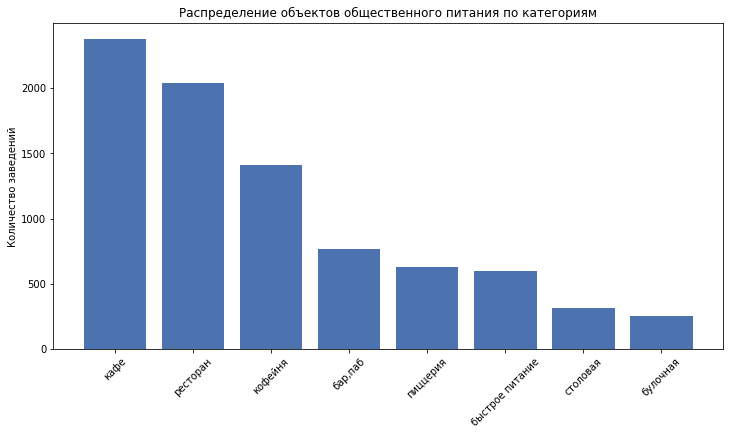

In [13]:
cat_uniq = (data.groupby('category', as_index=False).agg({'name': 'count'})).sort_values(by='name', ascending=False)
display(cat_uniq)
with plt.style.context('seaborn-deep'):
    plt.show()
    fig, ax = plt.subplots(figsize=(12, 6))
    plt.xticks(rotation=45)
    plt.ylabel('Количество заведений')
    plt.title('Распределение объектов общественного питания по категориям')
    plt.bar(cat_uniq['category'], cat_uniq['name'])

На представленной диаграмме показано распределение заведений общепита по категориям. Здесь мы видим, что все заведения распределены по 8 категориям, первые три места занимают кафе, рестораны и кофейни из чего можно сделать вывод о том, что именно эти объекты общественного питания пользуются наибольшей популярностью. Аутсайдерами являются столовые и булочные.

,category,seats
6,ресторан,86.0
0,"бар,паб",82.5
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


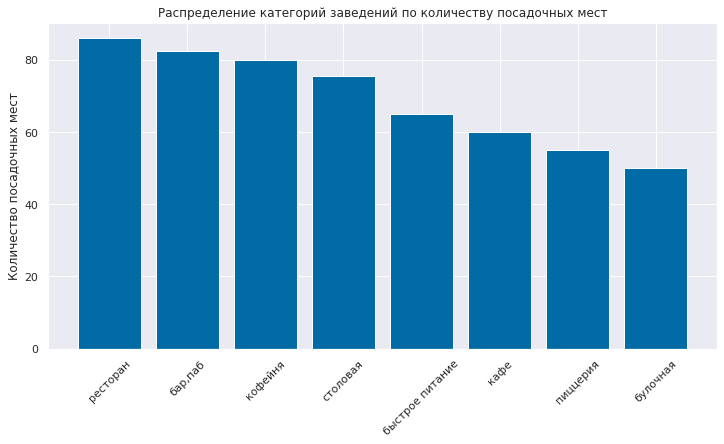

In [93]:
cat_seats = (data.groupby('category', as_index=False).agg({'seats': 'median'})).sort_values(by='seats', ascending=False)
display(cat_seats)
with plt.style.context('tableau-colorblind10'):
    plt.show()
    fig, ax = plt.subplots(figsize=(12, 6))
    plt.xticks(rotation=45)
    plt.ylabel('Количество посадочных мест')
    plt.title('Распределение категорий заведений по количеству посадочных мест')
    plt.bar(cat_seats['category'], cat_seats['seats'])

Здесь мы видим распределение категорий заведений общественного питания по количеству посадочных мест. Исходя из данной визуализации можно сказать, что рестораны и кафе занимают скорее всего гораздо большие площади, так как там в этих заведениях большее количество посадочных мест по сравнению с другими категориями. Затем идут кофейни. И снова последние строчки в данной сортировке занимают столовые и булочные.

Построим диаграмму "ящик с усами", чтобы посмотреть на распределение количества посадочных мест в зависимости от категории заведения

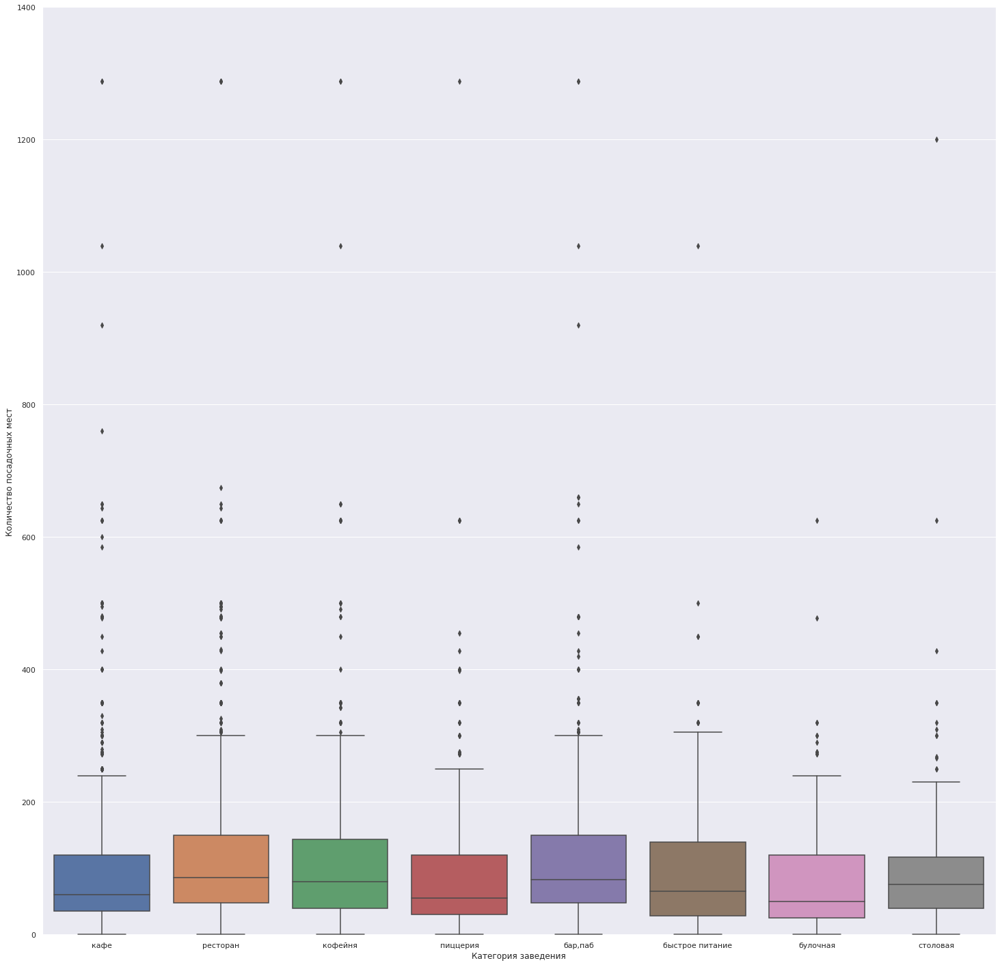

In [122]:
plt.figure(figsize = (25, 25))
sns.boxplot(data = data, y='seats', x='category');
plt.ylim(-1, 1400)
plt.ylabel('Количество посадочных мест')
plt.xlabel('Категория заведения')
plt.show()

In [102]:
data['seats'].describe() #определим значения квартилей, среднее и максимальное значение в колонке seats

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

На диаграмме явно видны выбросы практически во всех категориях. Определим межквартильное расстояние равным 100 и примем границу для критических выбросов равной 350 и посмотрим, как распределятся категории заведений по количеству посадочных мест.

In [117]:
data_drop = data.query('seats < 350')

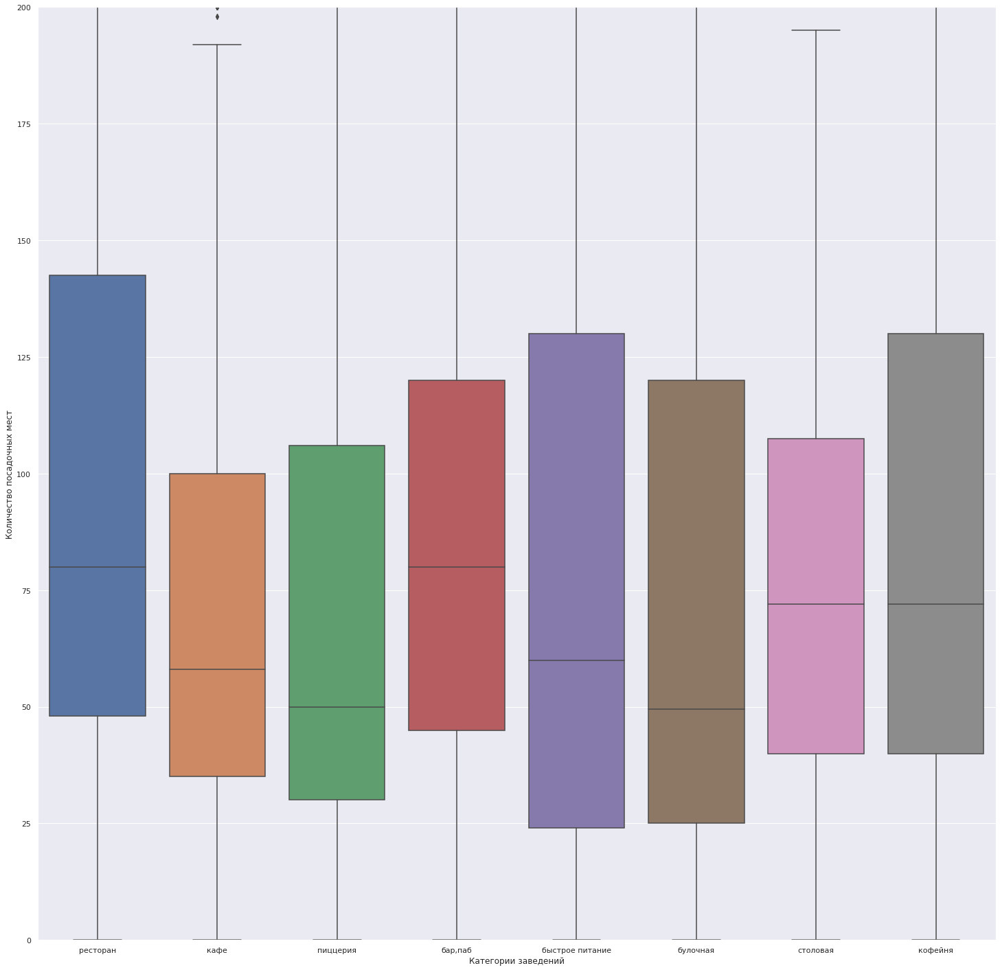

In [121]:
plt.figure(figsize = (25, 25))
sns.boxplot(data = data_drop, y='seats', x='category');
plt.ylim(0, 200)
plt.ylabel('Количество посадочных мест')
plt.xlabel('Категории заведений')
plt.show()

Судя по медианным значениям лидерами по количеству посадочных мест являются рестораны и пабы с барами. Следом за ними идут кофейни и столовые.

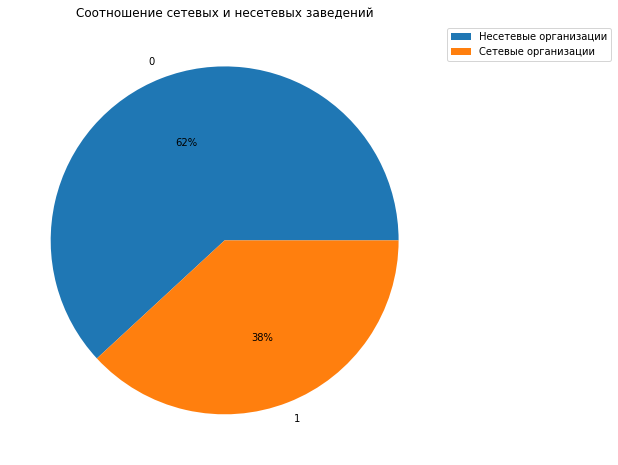

In [49]:
chains = (data.groupby('chain', as_index=False).agg({'name': 'count'}))
chains.plot(y='name', kind='pie', autopct='%1.0f%%', subplots=True, figsize=(8, 8))
plt.title('Соотношение сетевых и несетевых заведений')
plt.ylabel('')
plt.legend(['Несетевые организации', 'Сетевые организации'], bbox_to_anchor=( 1 , 1 ), loc='upper left')
plt.show()

На этой диаграмме видно, что несетевые заведения значительно преобладают над сетевыми. Надо посмотреть какие категории заведений чаще являются сетевыми.

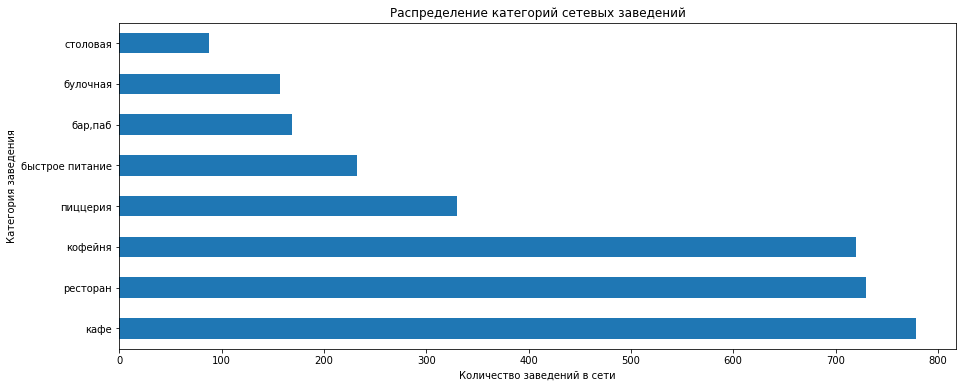

In [16]:
data_chain = data[data['chain'] == 1]
data_chain['category'].value_counts().plot.barh(figsize=(15, 6), title='Распределение категорий сетевых заведений')
plt.xlabel('Количество заведений в сети')
plt.ylabel('Категория заведения');

Снова мы видим, что на первых местах кафе, рестораны и кофейни. Данные категории заведений чаще всего являются сетевыми среди остальных. 

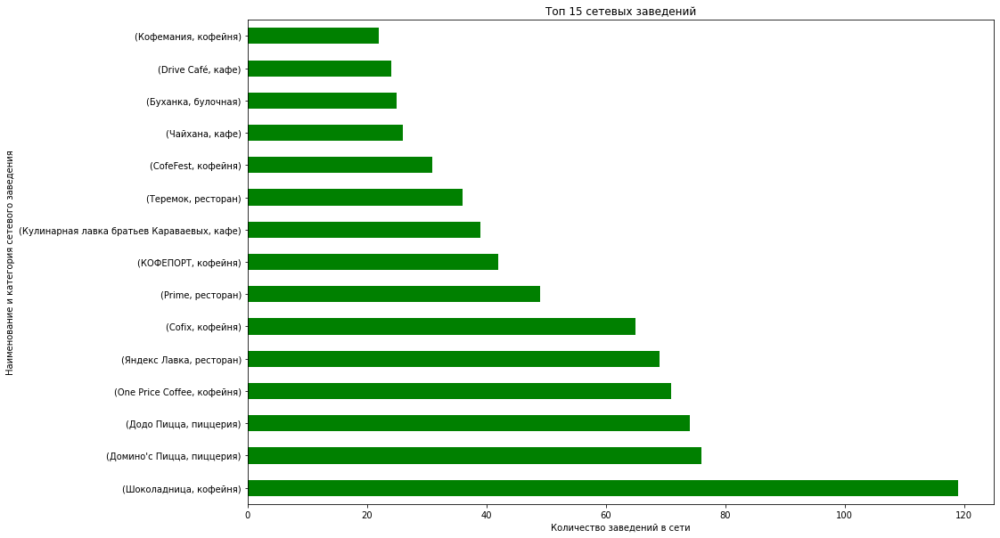

In [17]:
data_chain_name = data_chain.pivot_table(index=
        ('name', 'category'), values='chain', aggfunc='count').sort_values(by='chain', ascending=False).head(15)
df = pd.DataFrame(data_chain_name)
df.plot(kind='barh', figsize=(15, 10), title='Топ 15 сетевых заведений', color='green', legend=False)
plt.xlabel('Количество заведений в сети')
plt.ylabel('Наименование и категория сетевого заведения');

В топ 15 сетевых заведений в основном входят кофейни: 6 из 15. Лидирует по количеству заведений сеть кофеен "Шоколадница". Еще в список вошли кофейни "One Price Coffee", "Cofix", "КОФЕПОРТ", "CofeFest" и "Кофемания". Второе и третье места занимают пиццерии "Домино'c Пицца" и "ДоДо Пицца", единственные из сетевых пиццерий, которые вошли топ 15. Из других категорий заведений в списке присутствуют 3 ресторана, 3 кафе и 1 булочная. Надо учесть, что ресторан "Яндекс Лавка", вошедший в список, по своей сути не является заведением общественного питания в привычном понимании, это сервис доставки продуктов и готовой еды.

Полученный список топ 15 сетей наводит на мысль о том, что наиболее популярным форматом предприятия общественного питания является относительно небольшое заведение с ограниченным ассортиментом, подходящее для короткой деловой встречи, свидания, встречи с друзьями. 

district
Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
dtype: int64

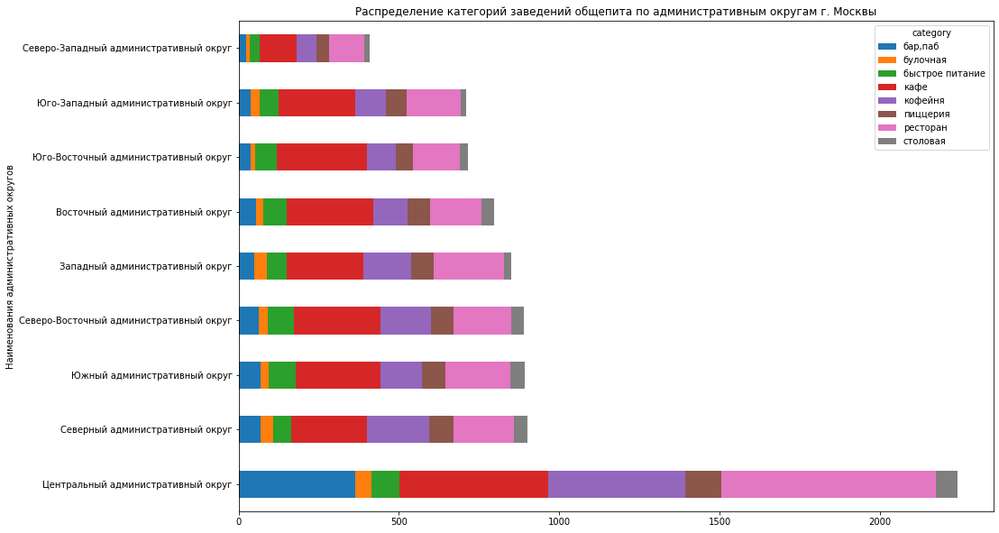

In [18]:
data_distr = data.pivot_table(index='category', columns='district',values='name', aggfunc='count')
sort_distr = data_distr.sum().sort_values(ascending=False)
display(sort_distr)
data_distr[sort_distr.index].T.plot.barh(stacked = True, figsize=(15,10))
plt.title('Распределение категорий заведений общепита по административным округам г. Москвы')
plt.xlabel('')
plt.ylabel('Наименования административных округов');

Судя по данной диаграмме в Москве есть 9 административных округа. Во всех округах, кроме Центрального ситуация с распределением заведений по категориям примерно одинаковое: наибольшее количество предствлено в категориях "кафе", "ресторан", "кофейня". Остальные категории представлены гораздо меньшим количеством. В Центральном округе ситуация немного другая: преобладают заведения в категории "ресторан", затем идут с примерно одинаковым значением "кафе" и "кофейня" и еще в гораздо большем количестве, чем в других округах, имеются бары и пабы.

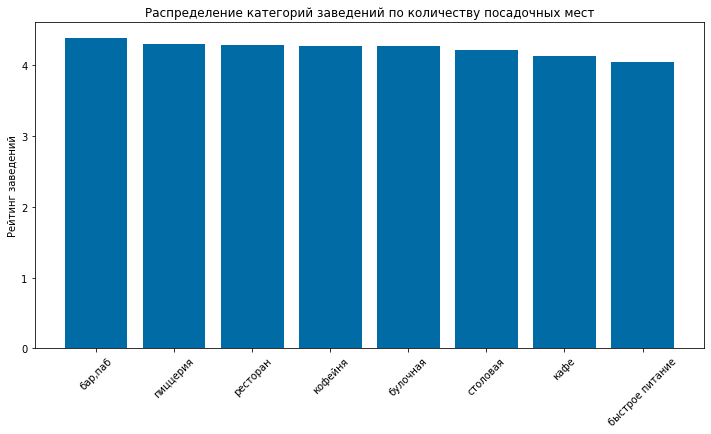

In [19]:
rating_avg = data.groupby(['category'], as_index=False).agg({'rating':'mean'}).sort_values(by='rating', ascending=False)
with plt.style.context('tableau-colorblind10'):
    plt.show()
    fig, ax = plt.subplots(figsize=(12, 6))
    plt.xticks(rotation=45)
    plt.ylabel('Рейтинг заведений')
    plt.title('Распределение категорий заведений по количеству посадочных мест')
    plt.bar(rating_avg['category'], rating_avg['rating'])

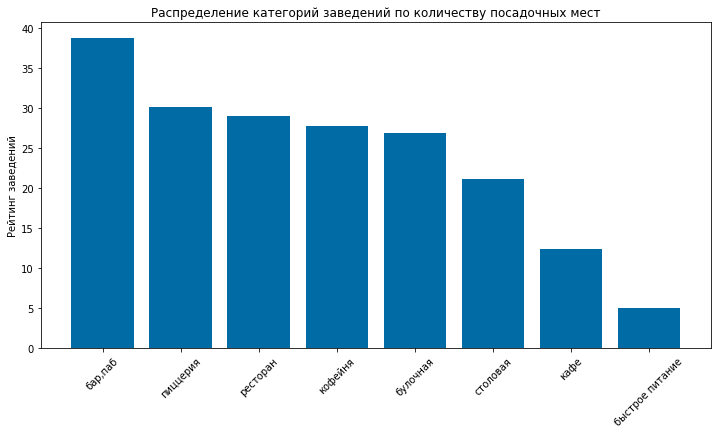

In [20]:
rating_avg['rating'] = ((rating_avg['rating'] - 4)*100)
with plt.style.context('tableau-colorblind10'):
    plt.show()
    fig, ax = plt.subplots(figsize=(12, 6))
    plt.xticks(rotation=45)
    plt.ylabel('Рейтинг заведений')
    plt.title('Распределение категорий заведений по количеству посадочных мест')
    plt.bar(rating_avg['category'], rating_avg['rating'])

На данной диаграмме мы видим, что наиболее высоки оценки получают пабы, бары. Далее с плавным снижением средней оценки идут пиццерии, рестораны, кофейни и булочные. В аутсайдерах предприятия быстрого питания, видимо из-за проблем с качеством продукции и обслуживания.

На следующем шаге выведем на экран фоновую картограмму Москвы с средним рейтингом заведений в каждом административном округе города.

In [21]:
state_geo = '/datasets/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.6,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

m

На картограмме видно, что наиболее высокий средний рейтинг имеют заведения в Северо-Восточном округе, а самый низкий - в Восточном. Также выделяются с невысоким средним показателем Центральный и Южный районы. В остальных округах значение среднего рейтинга примерно одинаковое на уровне 4,3-4,4.

Далее отобразим все заведения общепита на карте Москвы с помощью кластеров.

In [22]:
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)

m

Выясним какие улицы входят в топ 15 по количеству заведений и какие категории преобладают.

street
 проспект Мира             184.0
 Профсоюзная улица         122.0
 проспект Вернадского      108.0
 Ленинский проспект        107.0
 Ленинградский проспект     95.0
 Дмитровское шоссе          88.0
 Каширское шоссе            77.0
 Варшавское шоссе           76.0
 Ленинградское шоссе        70.0
 МКАД                       65.0
 Люблинская улица           60.0
 улица Вавилова             55.0
 Кутузовский проспект       54.0
 улица Миклухо-Маклая       49.0
 Пятницкая улица            48.0
dtype: float64

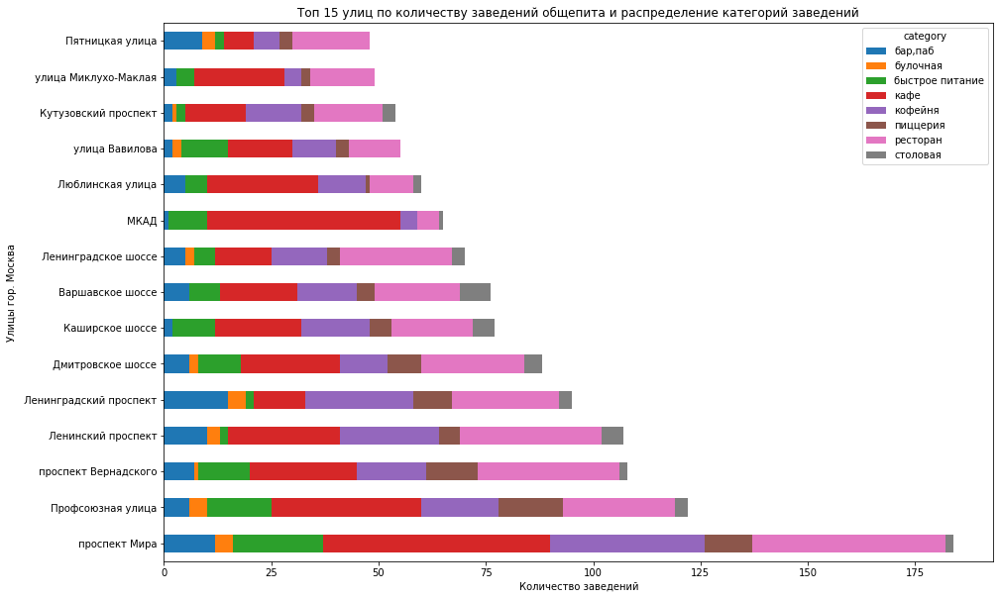

In [23]:
data_street = data.pivot_table(index='category', columns='street',values='name', aggfunc='count')
sort_street = data_street.sum().sort_values(ascending=False).head(15)
display(sort_street)
data_street[sort_street.index].T.plot.barh(stacked = True, figsize=(15,10))
plt.title('Топ 15 улиц по количеству заведений общепита и распределение категорий заведений')
plt.xlabel('Количество заведений')
plt.ylabel('Улицы гор. Москва');

На проспекте Мира самое большое количество заведений. Следом с разницей почти 35% идет Профсоюзная улица и затем наблюдается более плавное снижение количества. Если смотреть на распределение количества заведений в разрезе категорий, то видно, что в основном явно выделяются три категории: рестораны, кафе и кофейни. Но на разных улицах такое распределение различается, например на МКАДе подавляющее большинство предприятий в категории "кафе".

In [24]:
data_str = data.groupby('street', as_index=False).agg({'name':'count'}).query('name == 1')
display(data_str.count())

street    458
name      458
dtype: int64

На 458 улицах Москвы имеется всего один объект общественного питания. Посмотрим, как они распределены на карте Москвы.

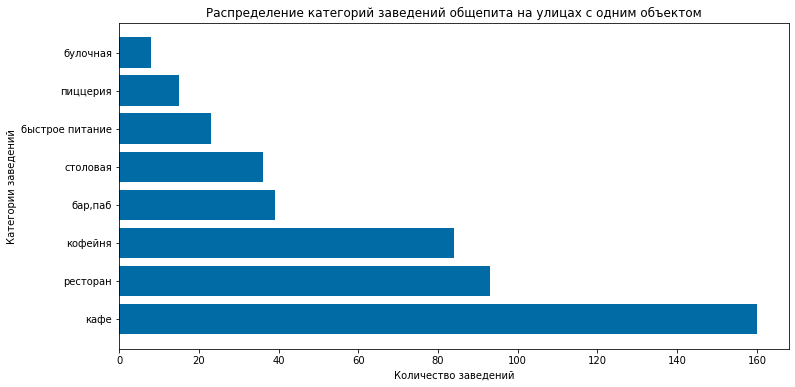

In [25]:
sort_1 = data.merge(data_str, on='street')
data_str_1 = sort_1.groupby('category', as_index=False).agg({'name_x':'count'}).sort_values(by='name_x', ascending=False)
with plt.style.context('tableau-colorblind10'):
    plt.show()
    fig, ax = plt.subplots(figsize=(12, 6))
    plt.xlabel('Количество заведений')
    plt.ylabel('Категории заведений')
    plt.title('Распределение категорий заведений общепита на улицах с одним объектом')
    plt.barh(data_str_1['category'], data_str_1['name_x'])

На улицах, где расположено всего одно заведение общепита, чаще всего таким заведением является кафе. Также довольно часто по сравнению с другими категориями это ресторан и кофейня.

In [26]:
bill_avg = data.groupby('district', as_index=False).agg({'middle_avg_bill':'median'})
data_bill_avg = data.merge(bill_avg).sort_values(by='middle_avg_bill', ascending=False)
bill_avg

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [27]:
bill_avg = data.groupby('district', as_index=False).agg({'middle_avg_bill':'median'})
data_bill_avg = data.merge(bill_avg).sort_values(by='middle_avg_bill', ascending=False)

with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

m_1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=bill_avg,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.6,
    legend_name='Медианный чек заведений по районам',
).add_to(m_1)

m_1

Наиболее высокий средний чек в Центральном и Западном округах. В целом наиболее высокие цены в центре, на западе и на северо-западе Москвы. Ближе к югу, востоку и северо-востоку столицы цены в заведениях общепита падают.

В результате исследования представленного датасета мы выяснили следующие моменты:
 - все заведения распределены по 8 категориям, первые три места занимают кафе, рестораны и кофейни из чего можно сделать вывод о том, что именно эти объекты общественного питания пользуются наибольшей популярностью. Аутсайдерами являются столовые и булочные;
 - рестораны и кафе занимают гораздо большие площади, так как там наблюдается большее количество посадочных мест по сравнению с другими категориями. Затем идут кофейни;
 - несетевые заведения значительно преобладают над сетевыми. Кафе, рестораны и кофейни чаще всего являются сетевыми;
 - в топ 15 сетевых заведений в основном входят кофейни: 6 из 15. Лидирует по количеству заведений сеть кофеен "Шоколадница". Второе и третье места занимают пиццерии "Домино'c Пицца" и "ДоДо Пицца", единственные из сетевых пиццерий, которые вошли топ 15. Вероятно, что наиболее популярным форматом предприятия общественного питания является относительно небольшое заведение с ограниченным ассортиментом, подходящее для короткой деловой встречи, свидания, встречи с друзьями;
 - во всех округах, кроме Центрального ситуация с распределением заведений по категориям примерно одинаковое: наибольшее количество предствлено в категориях "кафе", "ресторан", "кофейня". Остальные категории представлены гораздо меньшим количеством. В Центральном округе ситуация немного другая: преобладают заведения в категории "ресторан", затем идут с примерно одинаковым значением "кафе" и "кофейня" и еще в гораздо большем количестве, чем в других округах, имеются бары и пабы;
 - наиболее высокие оценки посетителей получают пабы, бары. Далее с плавным снижением средней оценки идут пиццерии, рестораны, кофейни и булочные. В аутсайдерах предприятия быстрого питания, видимо из-за проблем с качеством продукции и обслуживания;
 - наиболее высокий средний рейтинг имеют заведения в Северо-Восточном округе, а самый низкий - в Восточном. Также выделяются с невысоким средним показателем Центральный и Южный районы. В остальных округах значение среднего рейтинга примерно одинаковое на уровне 4,3-4,4;
 - на проспекте Мира самое большое количество заведений. Следом с разницей почти 35% идет Профсоюзная улица и затем наблюдается более плавное снижение количества. Если смотреть на распределение количества заведений в разрезе категорий, то видно, что в основном явно выделяются три категории: рестораны, кафе и кофейни. Но на разных улицах такое распределение различается, например на МКАДе подавляющее большинство предприятий в категории "кафе";
 - на улицах, где расположено всего одно заведение общепита, чаще всего таким заведением является кафе. Также довольно часто по сравнению с другими категориями это ресторан и кофейня;
 - наиболее высокий средний чек в Центральном и Западном округах. В целом наиболее высокие цены в центре, на западе и на северо-западе Москвы. Ближе к югу, востоку и северо-востоку столицы цены в заведениях общепита падают.

## Детализация исследования: открытие кофейни.

На данном этапе постараемся представить данные о кофейнях и дать рекомендации о перспективности открытия нового заведения.

In [28]:
data_cof = data[data['category'] == 'кофейня']
data_cof['name'].count() #подсчитаем количество кофеен

1413

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


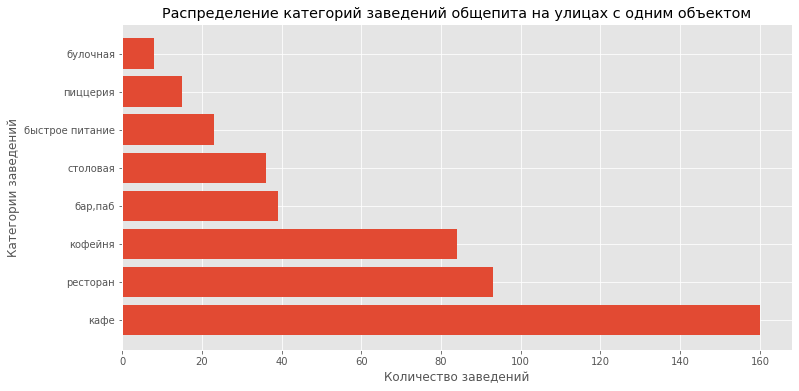

In [51]:
distr_cof = (data_cof.groupby('district', as_index=False).agg({'name': 'count'})).sort_values(by='name', ascending=False)
display(distr_cof)
with plt.style.context('ggplot'):
    plt.show()
    fig, ax = plt.subplots(figsize=(12, 6))
    plt.xlabel('Количество заведений')
    plt.ylabel('Категории заведений')
    plt.title('Распределение категорий заведений общепита на улицах с одним объектом')
    plt.barh(data_str_1['category'], data_str_1['name_x']);

In [31]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m_cof = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m_cof)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data_cof.apply(create_clusters, axis=1)

m_cof

In [32]:
data_cof_24 = data_cof[data_cof['is_24/7'] == True]
data_cof_24['name'].count() #количество круглосуточных кофеен

59

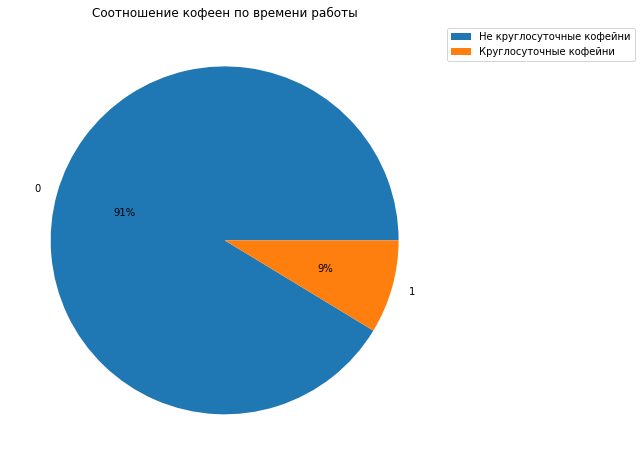

In [56]:
data_cof_24_7 = (data.groupby('is_24/7', as_index=False).agg({'name': 'count'}))
data_cof_24_7.plot(y='name', kind='pie', autopct='%1.0f%%', subplots=True, figsize=(8, 8))
plt.title('Соотношение кофеен по времени работы')
plt.ylabel('')
plt.legend(['Не круглосуточные кофейни', 'Круглосуточные кофейни'], bbox_to_anchor=( 1 , 1 ), loc='upper left')
plt.show()

Согласно представленным данным количество кофеен в Москве 1413. Самое большое количество заведений этой категории (30% от всех кофеен) располагается в Центральном округе. На втором и третьем местах стоят Северный и Северо-Восточный округи с количеством 193 и 159 кофеен, далее наблюдается плавное снижение. Меньше всего кофе пьют в Северо-Западном округе. 

Только 59, что составляет всего 9% от всего количества, всех кофеен в Москве функционируют круглосуточно.

In [34]:
state_geo = '/datasets/admin_level_geomap.geojson'

moscow_lat, moscow_lng = 55.751244, 37.618423

m_rat_cof = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=data_cof,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.6,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m_rat_cof)

m_rat_cof

Наиболее высокий средний рейтинг у кофеен в Восточном и Северо-Восточном округах. Также неплохие оценки дают любители кофе в Юго-Восточном и Северо-Западном округах. Наиболее низкие рейтинги в Западном, Северном и Южном регионах столицы. Получается, что в районах с меньшей концентрацией кофеен рейтинги выше, чем в других, высокая концентрация предприятий в рассматриваемой категории не способствует улучшения качества обслуживания. Либо посетители в Центральном округе наиболее привиредливы из-за большого выбора мест посещения.

In [35]:
bill_avg_cof = data_cof.groupby(
    'district', as_index=False).agg({'middle_coffee_cup':'median'}).sort_values(by='middle_coffee_cup', ascending=False)
data_bill_avg_cof = data_cof.merge(bill_avg_cof).sort_values(by='middle_coffee_cup', ascending=False)
bill_avg_cof

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


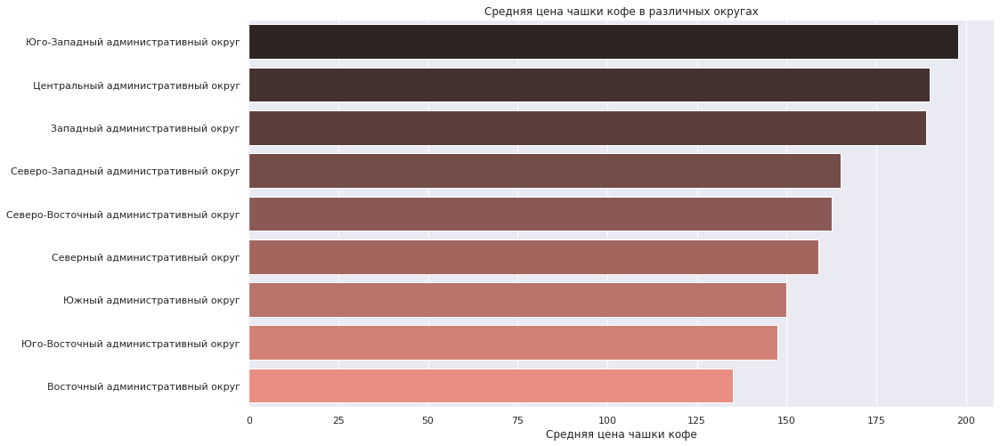

In [91]:
plt.figure(figsize=(15,8))
ax = sns.barplot(data=bill_avg_cof, x="middle_coffee_cup", y="district", palette='dark:salmon')
ax.set(xlabel='Средняя цена чашки кофе', ylabel='', title='Средняя цена чашки кофе в различных округах');

Средняя цена чашки кофе довольно сильно различается в зависимости от расположения кофейни. Дороже всего в Юго-Западном, Центральном и Западном административных округах. Здесь стоимость кофе колеблется между 190-200 рублями. Самые низкие цены в Южном, Юго-Восточном и Восточном округах, там чашка кофе стоит 150 рублей и ниже.

Если подвести итог исследования на предмет рекомендаций по открытию новой кофейни, то позволим себе дать рекомендовать рассмотреть для бизнеса открытие заведения в Юго-Западном административном округе, так как на данный момент в данном регионе не столь высокая концентрация подобных предприятий, как в центре и на севере Москвы. Также в данном округе довольно высокий средний рейтинг у имеющихся кофеен, значит скорее всего люди кофе там любят и им предлагают довольно качественное обслуживание. Средний чек при этом в данном округе самый высокий, поэтому имеется больше шансов окупить бизнес. Исходя из этого можем порекомендовать установить цену чашки кофе в 195 рублей.

## Презентация

Презентация: <https://disk.yandex.ru/i/S_ZYjfj5FmtLKw>